In [1]:
#Importing libraries
import pandas as pd
import matplotlib.pyplot as plt
import re
import string

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

!pip install textblob
from textblob import TextBlob

import seaborn as sns

!pip install wordcloud
from wordcloud import WordCloud
from collections import Counter

!pip install plotly
import plotly.express as px

#Importing data 
dataset=pd.read_csv('vaccination_all_tweets.csv')

#DATA UNDERSTANDING

#Displaying first rows of the dataset
dataset.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False


In [2]:
#Displaying the number of tweets the dataset contains
display(dataset.shape,"There are "+str(dataset.shape[0])+" tweets in the dataset")

(228207, 16)

'There are 228207 tweets in the dataset'

In [3]:
#Informtion about the dataset variables and instances
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 228207 entries, 0 to 228206
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   id                228207 non-null  int64 
 1   user_name         228205 non-null  object
 2   user_location     161296 non-null  object
 3   user_description  211189 non-null  object
 4   user_created      228207 non-null  object
 5   user_followers    228207 non-null  int64 
 6   user_friends      228207 non-null  int64 
 7   user_favourites   228207 non-null  int64 
 8   user_verified     228207 non-null  bool  
 9   date              228207 non-null  object
 10  text              228207 non-null  object
 11  hashtags          178504 non-null  object
 12  source            228088 non-null  object
 13  retweets          228207 non-null  int64 
 14  favorites         228207 non-null  int64 
 15  is_retweet        228207 non-null  bool  
dtypes: bool(2), int64(6), object(8)
memory

<AxesSubplot:>

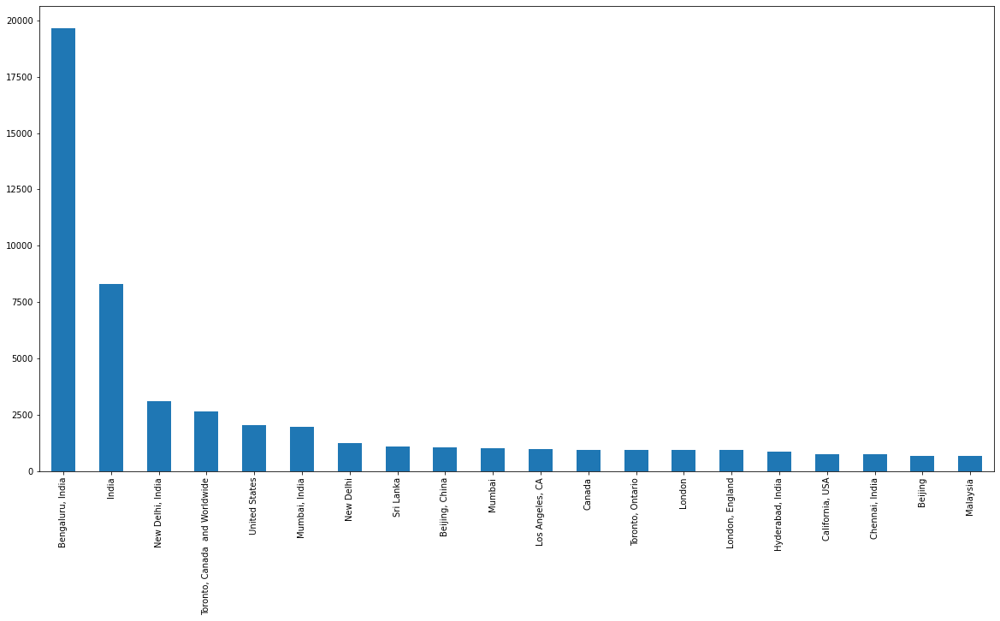

In [4]:
#Plot the first 20 largest tweets' locations
plt.figure(figsize=(20,10))
dataset['user_location'].value_counts().nlargest(20).plot(kind='bar')

In [5]:
#Eliminate duplicated tweets and display the total number again
dataset=dataset.drop_duplicates('text')
dataset.shape

(226373, 16)

In [6]:
#See the number of tweets each source has
dataset.source.value_counts()

Twitter for Android         58553
Twitter Web App             57050
Twitter for iPhone          49396
CowinAlertsBot              11276
cowin_vaccine_app           10203
                            ...  
Twitter Bot 150Games.com        1
Vitamin.Rush                    1
PromoRepublic                   1
United blog to twitter          1
endpoint                        1
Name: source, Length: 379, dtype: int64

<AxesSubplot:>

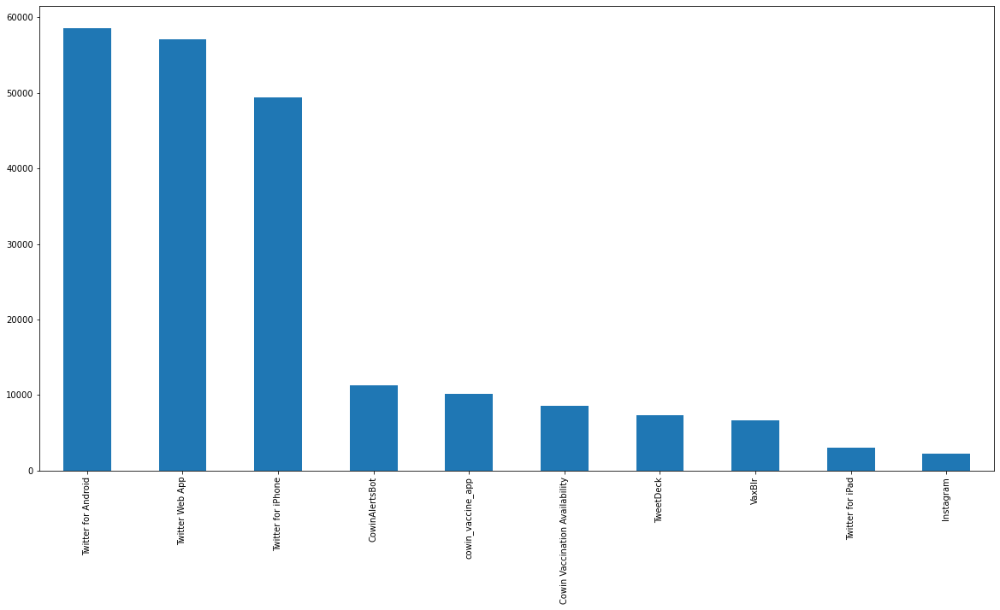

In [7]:
#Display the first 10 most popular sources
plt.figure(figsize=(20,10))
dataset['source'].value_counts().nlargest(10).plot(kind='bar')

In [8]:
#Display most old and recent tweets
dataset.sort_values(by=['date'], ascending=[True]).head(2)

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
44,1337727767551553536,Daily News Egypt,Egypt,Egypt's Only Daily Independent Newspaper in En...,2009-04-26 07:56:24,278080,116,765,True,2020-12-12 11:55:28,#FDA authorizes #PfizerBioNTech #coronavirus v...,"['FDA', 'PfizerBioNTech', 'coronavirus']",Twitter Web App,1,1,False
43,1337728701820268544,City A.M.,"London, England","London's business newspaper - News, Opinion, a...",2009-06-09 13:53:06,66224,603,771,True,2020-12-12 11:59:10,Trump announces #vaccine rollout 'in less than...,['vaccine'],Twitter Web App,0,2,False


In [9]:
#DATA CLEANING

#Eliminate unnecessary columns
cols_to_drop = ["id","user_name","user_description","user_created","user_followers","user_friends","user_favourites","user_verified","hashtags","source","retweets","favorites","is_retweet"]
dataset = dataset.drop(cols_to_drop,axis=1)
dataset.head(5)

,user_location,date,text
0,"La Crescenta-Montrose, CA",2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...
1,"San Francisco, CA",2020-12-13 16:27:13,While the world has been on the wrong side of ...
2,Your Bed,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBio...
3,"Vancouver, BC - Canada",2020-12-12 20:23:59,"Facts are immutable, Senator, even when you're..."
4,NaN,2020-12-12 20:17:19,Explain to me again why we need a vaccine @Bor...


In [10]:
#Convert date to YYYY-MM-DD format
dataset.date = pd.to_datetime(dataset.date).dt.date
dataset.head()

,user_location,date,text
0,"La Crescenta-Montrose, CA",2020-12-20,Same folks said daikon paste could treat a cyt...
1,"San Francisco, CA",2020-12-13,While the world has been on the wrong side of ...
2,Your Bed,2020-12-12,#coronavirus #SputnikV #AstraZeneca #PfizerBio...
3,"Vancouver, BC - Canada",2020-12-12,"Facts are immutable, Senator, even when you're..."
4,NaN,2020-12-12,Explain to me again why we need a vaccine @Bor...


In [11]:
#Remove urls from the tweets
remove_url = lambda x: re.sub(r'https\S+', '', str(x))
without_url = dataset.text.apply(remove_url)
without_url.head()

0    Same folks said daikon paste could treat a cyt...
1    While the world has been on the wrong side of ...
2    #coronavirus #SputnikV #AstraZeneca #PfizerBio...
3    Facts are immutable, Senator, even when you're...
4    Explain to me again why we need a vaccine @Bor...
Name: text, dtype: object

In [12]:
#Convert all text into lower cases
convert_lower = lambda x : x.lower()
lower_text = without_url.apply(convert_lower)
lower_text.head()

0    same folks said daikon paste could treat a cyt...
1    while the world has been on the wrong side of ...
2    #coronavirus #sputnikv #astrazeneca #pfizerbio...
3    facts are immutable, senator, even when you're...
4    explain to me again why we need a vaccine @bor...
Name: text, dtype: object

In [13]:
#Eliminate puntuations
rmv_pcs = lambda x : x.translate(str.maketrans('', '', string.punctuation))
without_punct = lower_text.apply(rmv_pcs)
without_punct

0         same folks said daikon paste could treat a cyt...
1         while the world has been on the wrong side of ...
2         coronavirus sputnikv astrazeneca pfizerbiontec...
3         facts are immutable senator even when youre no...
4         explain to me again why we need a vaccine bori...
                                ...                        
228202    45 urban bengaluru covidvaccine availability f...
228203    1844 bbmp bengaluru covidvaccine availability ...
228204    1844 urban bengaluru covidvaccine availability...
228205    they promote their vaccines leaving out the st...
228206    45 urban bengaluru covidvaccine availability f...
Name: text, Length: 226373, dtype: object

In [14]:
dataset.text=without_punct

In [15]:
#Downloading stopwords
lemmatizer = WordNetLemmatizer()
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\miren\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\miren\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [16]:
stop_words = stopwords.words('english')   
len(stop_words),stop_words[0:10]

(179,
 ['i',
  'me',
  'my',
  'myself',
  'we',
  'our',
  'ours',
  'ourselves',
  'you',
  "you're"])

In [17]:
#Removing stopwords
def stopWords(tweet):
  clean_tweet = tweet
  clean_tweet = " ".join(word for word in clean_tweet.split() if word not in stop_words)
  return clean_tweet

In [18]:
dataset.text = dataset.text.apply(lambda x: stopWords(x))

In [19]:
dataset.head()

,user_location,date,text
0,"La Crescenta-Montrose, CA",2020-12-20,folks said daikon paste could treat cytokine s...
1,"San Francisco, CA",2020-12-13,world wrong side history year hopefully bigges...
2,Your Bed,2020-12-12,coronavirus sputnikv astrazeneca pfizerbiontec...
3,"Vancouver, BC - Canada",2020-12-12,facts immutable senator even youre ethically s...
4,NaN,2020-12-12,explain need vaccine borisjohnson matthancock ...


In [20]:
# Function to assign polarity and subjectivity to the tweets
def blob_fun(text):
  sentiments = TextBlob(text)
  polarity_sents = sentiments.sentiment.polarity
  subjetivity_sents = sentiments.sentiment.subjectivity

  if polarity_sents > 0.5:
    res = 'Very positive'

  elif polarity_sents > 0:
    res = 'Positive'

  elif polarity_sents == 0:
    res ="Neutral"
    
  elif polarity_sents < 0:
    res = 'Negative'
    
  elif polarity_sents < 0.5:
    res = 'Very negative'

  result = {'polarity':polarity_sents,'subjectivity':subjetivity_sents,'sentiment':res}

  return result

In [21]:
blob_fun(dataset.text[3])

{'polarity': 0.1, 'subjectivity': 0.55, 'sentiment': 'Positive'}

In [22]:
dataset['results'] = dataset.text.apply(blob_fun)


In [23]:
dataset = dataset.join(pd.json_normalize(dataset.results))

In [24]:
dataset.head()

,user_location,date,text,results,polarity,subjectivity,sentiment
0,"La Crescenta-Montrose, CA",2020-12-20,folks said daikon paste could treat cytokine s...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral
1,"San Francisco, CA",2020-12-13,world wrong side history year hopefully bigges...,"{'polarity': -0.5, 'subjectivity': 0.9, 'senti...",-0.5,0.900000,Negative
2,Your Bed,2020-12-12,coronavirus sputnikv astrazeneca pfizerbiontec...,"{'polarity': 0.0, 'subjectivity': 0.0333333333...",0.0,0.033333,Neutral
3,"Vancouver, BC - Canada",2020-12-12,facts immutable senator even youre ethically s...,"{'polarity': 0.1, 'subjectivity': 0.55, 'senti...",0.1,0.550000,Positive
4,NaN,2020-12-12,explain need vaccine borisjohnson matthancock ...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral


In [25]:
counts_df = dataset.sentiment.value_counts().reset_index()
counts_df

,index,sentiment
0,Neutral,128271
1,Positive,63847
2,Negative,21829
3,Very positive,10595


<AxesSubplot:xlabel='index', ylabel='sentiment'>

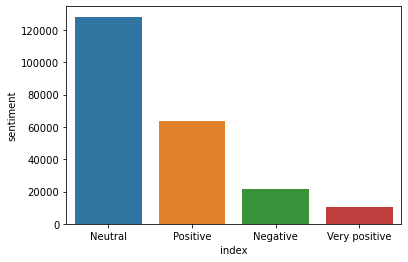

In [26]:
sns.barplot(data=counts_df, x='index', y='sentiment')

In [27]:
# categorized tweets in seperate Series
very_positive_tweet = dataset[dataset.sentiment == 'Very positive']['text']
positive_tweet =  dataset[dataset.sentiment == 'Positive']['text']
negative_tweet =  dataset[dataset.sentiment == 'Negative']['text']
neutral_tweet =  dataset[dataset.sentiment == 'Neutral']['text']

In [28]:
# Function for creating WordClouds
def cloud_of_Words(tweet_cat,title):
    forcloud = ' '.join([tweet for tweet in tweet_cat])
    wordcloud = WordCloud(width =700,height = 300,random_state =5,max_font_size=110).generate(forcloud)
    plt.imshow(wordcloud, interpolation ='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()
    plt.figure(figsize = (10,8))

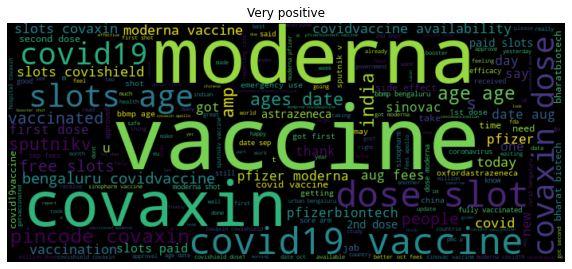

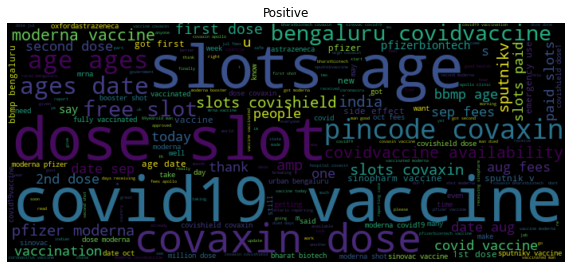

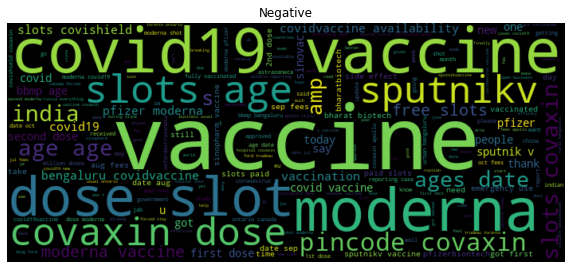

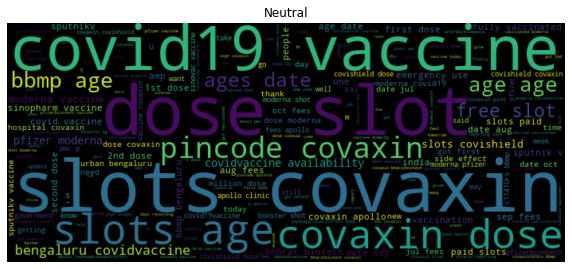

<Figure size 720x576 with 0 Axes>

In [29]:
plt.figure(figsize = (10,8))
# Creating wordclouds for positive, negative, neutral tweets
cloud_of_Words(very_positive_tweet, 'Very positive')
cloud_of_Words(positive_tweet, 'Positive')
cloud_of_Words(negative_tweet, 'Negative')
cloud_of_Words(neutral_tweet, 'Neutral')

In [30]:
# Breaking down the tweets into words in seperate categories
very_positive_tokens = [token for line in very_positive_tweet for token in line.split()]
positive_tokens = [token for line in positive_tweet for token in line.split()]
negative_tokens = [token for line in negative_tweet for token in line.split()]
neutral_tokens = [token for line in neutral_tweet for token in line.split()]

In [31]:
# to get most used words
def get_maxtoken(tweets,num=30):
  word_tokens = Counter(tweets)
  max_common = word_tokens.most_common(num)
  return dict(max_common)

In [32]:
def token_df_vis(x, title):
  df = pd.DataFrame(get_maxtoken(x).items(),columns=['words','count'])
   
  fig = px.bar(df,x='words',y='count',title = title)
  fig.show()

In [33]:
token_df_vis(very_positive_tokens,'Very positive')
token_df_vis(positive_tokens,'Positive')
token_df_vis(negative_tokens,'Negative')
token_df_vis(neutral_tokens,'Neutral')

In [34]:
fig = px.scatter(dataset,x='polarity',y='subjectivity')
fig.show()